# 

# Redlining – Racism you can see from space

Redlining is a form of systemic racism that funnels resources away from
(typically) Black neighborhoods in the United States. Several mechanisms
contribute to the overall disinvestment, including requirements that
particular homeowners sell only to other white people, and labeling
Black neighborhoods as poor investments and thereby preventing anyone in
those neighborhoods from getting mortgages and other loans.

<figure>
<img
src="https://dsl.richmond.edu/panorama/redlining/static/images/decatur.jpg"
alt="Redlining map from Decatur, IL courtesy of Mapping Inequality (Nelson and Winling (2023))" />
<figcaption aria-hidden="true">Redlining map from Decatur, IL courtesy
of Mapping Inequality (<span class="citation"
data-cites="nelson_mapping_2023">Nelson and Winling
(2023)</span>)</figcaption>
</figure>

You can read more about redlining and data science in (Chapter 2 of Data
Feminism ( D’Ignazio and Klein 2020)).

In this case study, you will download satellite-based **multispectral**
data for the City of Denver, and compare that to redlining maps and
results from the U.S. Census American Community Survey.

D’Ignazio, Catherine, and Lauren Klein. 2020. “2. Collect, Analyze,
Imagine, Teach.” In *Data Feminism*.

Nelson, Robert K, and LaDale Winling. 2023. “Mapping Inequality:
Redlining in New Deal America.” In *American Panorama: An Atlas of
United States History*, edited by Robert K Nelson and Edward L. Ayers.
<https://dsl.richmond.edu/panorama/redlining.>

# STEP 1: Set up your analysis

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It: Import packages</div></div><div class="callout-body-container callout-body"><p>Add imports for packages that help you:</p>
<ol type="1">
<li>Work with the file system interoperably</li>
<li>Work with vector data</li>
<li>Create interactive plots of vector data</li>
</ol></div></div>

In [1]:
# Interoperable file paths
# Find the home folder
# Work with vector data
# Interactive plots of vector data
import geopandas as gpd
import pandas as pd
import os
import pathlib
import hvplot.pandas


<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It: Prepare data directory</div></div><div class="callout-body-container callout-body"><p>In the cell below, <strong>reproducibly and interoperably</strong>
define and create a project data directory somewhere in your home
folder. Be careful not to save data files to your <code>git</code>
repository!</p></div></div>

In [2]:
# Define and create the project data directory
data_dir=os.path.join(
    pathlib.Path.home(),
    'earth-analytics',
    'data',
    'redlining'
)
os.makedirs(data_dir, exist_ok=True)

## STEP 2: Site map

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It: Define your study area</div></div><div class="callout-body-container callout-body"><ol type="1">
<li>Copy the <strong>geopackage</strong> URL for the <a
href="https://dsl.richmond.edu/panorama/redlining/data">University of
Richmond</a></li>
<li>Load the <em>vector</em> data into Python, making sure to cache the
download so you don’t have to run it multiple times.</li>
<li>Create a quick plot to check the data</li>
</ol></div></div>


c:\Users\arago\miniconda3\envs\earth-analytics-python\Lib\site-packages\pyogrio\core.py:35: RuntimeWarning: Could not detect GDAL data files.  Set GDAL_DATA environment variable to the correct path.
  _init_gdal_data()
c:\Users\arago\miniconda3\envs\earth-analytics-python\Lib\site-packages\pyogrio\raw.py:198: RuntimeWarning: C:\Users\arago\earth-analytics\data\redlining\redlining\redlining.shp contains polygon(s) with rings with invalid winding order. Autocorrecting them, but that shapefile should be corrected using ogr2ogr for example.
  return ogr_read(


<Axes: >

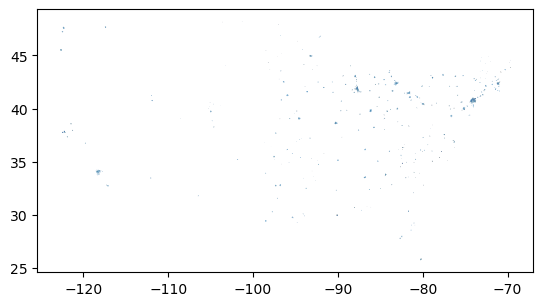

In [3]:
# Define info for redlining download
redlining_url=(
    "https://dsl.richmond.edu/panorama/redlining/static/mappinginequality.gpkg"
)
redlining_dir= os.path.join(data_dir, 'redlining')
os.makedirs(redlining_dir, exist_ok=True)
redlining_path=os.path.join(redlining_dir, 'redlining.shp')

# Only download once
if not os.path.exists(redlining_path):
    redlining_gdf= gpd.read_file(redlining_url)
    redlining_gdf.to_file(redlining_path)

# Load from file
redlining_gdf=gpd.read_file(redlining_path)

# Check the data
redlining_gdf.plot()

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It: Create an interactive site map</div></div><div class="callout-body-container callout-body"><p>In the cell below:</p>
<ol type="1">
<li>Select only the data where the <code>city</code> column is equal to
<code>"Denver"</code>.</li>
<li>For now, dissolve the regions with the <code>.dissolve()</code>
method so we see only a map of Denver.</li>
<li>Plot the data with the <code>EsriImagery</code> tile source basemap.
Make sure we can see your basemap underneath!</li>
</ol></div></div>

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-respond"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Reflect and Respond: Write a site description</div></div><div class="callout-body-container callout-body"><p>Your site description should address:</p>
<ol type="1">
<li>Is there anything relevant to this analysis that you notice in your
site map?</li>
<li>Research about the <strong>context</strong> of this analysis. You
could include information about the climate and history of the Denver
area. How might racism, water rights, or other societal forces have
influenced the distribution of urban green space in Denver? Aim for a
paragraph of text.</li>
<li>Citations for the site data and your context sources.</li>
</ol></div></div>

In [4]:
den_redlining_gdf = redlining_gdf[redlining_gdf.city=='Denver']
den_redlining_gdf.dissolve().hvplot(
    geo=True, titles='EsriImagery',
    title = 'City of Denver',
    fill_color=None,line_color='darkblue',line_width=3,
    frame_width=600
)

c:\Users\arago\miniconda3\envs\earth-analytics-python\Lib\site-packages\dask\dataframe\__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


:Polygons   [Longitude,Latitude]

The above map shows the City of Denver, CO boundary. Within the map will indicate the redlining zones for further socio economic analysis. 

Data downloaded from: https://dsl.richmond.edu/panorama/redlining/data

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It: Store variables</div></div><div class="callout-body-container callout-body"><p>Store any variables you want for later. This should definitely
include your un-dissolved denver redlining <code>GeoDataFrame</code> and
your data directory path.</p></div></div>

In [5]:
%store den_redlining_gdf data_dir

Stored 'den_redlining_gdf' (GeoDataFrame)
Stored 'data_dir' (str)


# STEP 3: Download and prepare green reflectance data

## Working with **raster** data

**Raster** data is arranged on a grid – for example a digital
photograph.

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-read"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Read More</div></div><div class="callout-body-container callout-body"><p>Learn more about raster data at this <a
href="https://www.earthdatascience.org/courses/use-data-open-source-python/intro-raster-data-python/">Introduction
to Raster Data with Python</a></p></div></div>

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It: Import stored variables and libraries</div></div><div class="callout-body-container callout-body"><p>For this case study, you will need a library for working with
geospatial raster data (<code>rioxarray</code>), more advanced libraries
for working with data from the internet and files on your computer
(<code>requests</code>, <code>zipfile</code>, <code>io</code>,
<code>re</code>). You will need to add:</p>
<ol type="1">
<li>A library for building interoperable file paths</li>
<li>A library to locate files using a pattern with wildcards</li>
</ol></div></div>

First

# Spectral Indices

## Observing vegetation health from space

When working with multispectral data, the individual reflectance values
do not tell us much, but their relationships do. A normalized **spectral
index** is a way of measuring the relationship between two (or more)
bands.

We will look vegetation cover using NDVI (Normalized Difference
Vegetation Index). How does it work? First, we need to learn about
spectral reflectance signatures.

Every object reflects some wavelengths of light more or less than
others. We can see this with our eyes, since, for example, plants
reflect a lot of green in the summer, and then as that green diminishes
in the fall they look more yellow or orange. The image below shows
spectral signatures for water, soil, and vegetation:

![](https://seos-project.eu/remotesensing/images/Reflexionskurven.jpg)
\> Image source: [SEOS
Project](https://seos-project.eu/remotesensing/remotesensing-c01-p06.html)

**Healthy vegetation** reflects a lot of **Near-InfraRed (NIR)**
radiation. Less healthy vegetation reflects a similar amounts of the
visible light spectra, but less NIR radiation. We don’t see a huge drop
in Green radiation until the plant is very stressed or dead. That means
that NIR allows us to get ahead of what we can see with our eyes.

![Healthy leaves reflect a lot of NIR radiation compared to dead or
stressed
leaves](attachment:../../img/earth-analytics/remote-sensing/spectral_vegetation_stress.png)
\> Image source: [Spectral signature literature review by
px39n](https://github.com/px39n/Awesome-Vegetation-Index)

Different species of plants reflect different spectral signatures, but
the *pattern* of the signatures are similar. NDVI compares the amount of
NIR reflectance to the amount of Red reflectance, thus accounting for
many of the species differences and isolating the health of the plant.
The formula for calculating NDVI is:

$$NDVI = \frac{(NIR - Red)}{(NIR + Red)}$$

Read more about NDVI and other vegetation indices:

-   [earthdatascience.org](https://www.earthdatascience.org/courses/use-data-open-source-python/multispectral-remote-sensing/vegetation-indices-in-python/calculate-NDVI-python/)
-   [USGS](https://www.usgs.gov/landsat-missions/landsat-surface-reflectance-derived-spectral-indices)

In [6]:
store -r band_dict

c:\Users\arago\miniconda3\envs\earth-analytics-python\Lib\site-packages\rasterio\env.py:664: RuntimeWarning: Cannot find gdalvrt.xsd (GDAL_DATA is not defined)
  elif GDALDataFinder().find_file("gdalvrt.xsd"):


<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It: Calculate NDVI</div></div><div class="callout-body-container callout-body"></div></div>

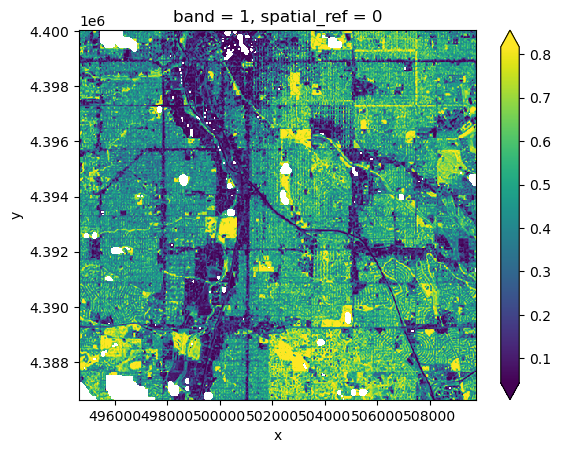

In [7]:
#1:38:41
ndvi_da = (
    (band_dict['nir'] - band_dict['red']) / (band_dict['nir'] + band_dict['red'])
)
ndvi_da.plot(robust=True)

In [ ]:
#band_dict['nir'].rio.nodata

In [8]:
%store ndvi_da

Stored 'ndvi_da' (DataArray)


<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-extra"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Looking for an Extra Challenge?: Calculate another index</div></div><div class="callout-body-container callout-body"><p>You can also calculating other indices that you find on the internet
or in the scientific literature. Some common ones in this context might
be the NDMI (moisture), NDBaI (bareness), or the NDBI (built-up).</p></div></div>

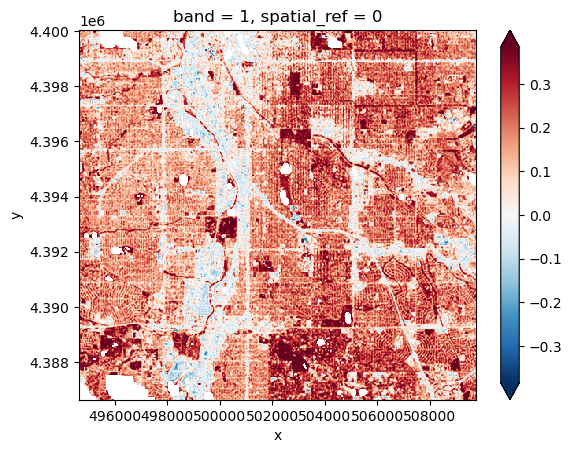

In [9]:
#NDMI calculation

ndmi_da = (band_dict['nir'] - band_dict['swirl']) / (band_dict['nir'] + band_dict['swirl'])
                                                    

ndmi_da.plot(robust=True)

In [10]:
%store -r denver_redlining_gdf data_dir

no stored variable or alias denver_redlining_gdf


In [11]:
# Reproducible file paths
#import re # Extract metadata from file names
import zipfile # Work with zip files
from io import BytesIO # Stream binary (zip) files
# Find files by pattern

import numpy as np # Unpack bit-wise Fmask
import requests # Request data over HTTP
import rioxarray as rxr # Work with geospatial raster data
import os
from glob import glob
import matplotlib.pyplot as plt

### Download raster data

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It: Download sample data</div></div><div class="callout-body-container callout-body"><ol type="1">
<li>Define a descriptive variable with the sample data url: <a
href="https://github.com/cu-esiil-edu/esiil-learning-portal/releases/download/data-release/redlining-foundations-data.zip">https://github.com/cu-esiil-edu/esiil-learning-portal/releases/download/data-release/redlining-foundations-data.zip</a></li>
<li>Define a descriptive variable with the path you want to store the
sample raster data.</li>
<li>Use a conditional to make sure you only download the data once!</li>
<li>Check that you successfully downloaded some <code>.tif</code>
files.</li>
</ol></div></div>

In [12]:
# Prepare URL and file path for download
rasterdata_url = (
    "https://github.com/cu-esiil-edu/esiil-learning-portal/releases"
    "/download/data-release/redlining-foundations-data.zip"
)
rasterdata_dir = os.path.join(data_dir, 'rasterdata')

if not glob(os.path.join(rasterdata_dir, '*.tif')):
    # Download sample raster data
    rasterdata_response = requests.get(rasterdata_url)

    # Save the raster data (uncompressed)
    with zipfile.ZipFile(BytesIO(rasterdata_response.content)) as rasterdata_zip:
        rasterdata_zip.extractall(rasterdata_dir)

### Working with multispectral data

The data you just downloaded is **multispectral** raster data. When you
take a color photograph, your camera actually takes three images that
get combined – a red, a green, and a blue image (or band, or channel).
Multispectral data is a little like that, except that it also often
contains spectral bands from outside the range human eyes can see. In
this case, you should have a Near-Infrared (NIR) band as well as the
red, green, and blue.

This multispectral data is part of the [Harmonized Landsat Sentinel 30m
dataset](https://lpdaac.usgs.gov/products/hlsl30v002/) (HLSL30), which
is a combination of data taken by the NASA Landsat missions and the
European Space Agency (ESA) Sentinel-2 mission. Both missions collect
multispectral data, and combining them gives us more frequent images,
usually every 2-3 days. Because they are harmonized with Landsat
satellites, they are also comparable with Landsat data from previous
missions, which go back to the 1980s.

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-read"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Read More</div></div><div class="callout-body-container callout-body"><p>Learn more about multispectral data in this <a
href="https://www.earthdatascience.org/courses/use-data-open-source-python/multispectral-remote-sensing/intro-multispectral-data/">Introduction
to Multispectral Remote Sensing Data</a></p></div></div>

For now, we’ll work with the green layer to get some practice opening up
raster data.

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It: Find the green layer file</div></div><div class="callout-body-container callout-body"><p>One of the files you downloaded should contain the
<strong>green</strong> band. To open it up:</p>
<ol type="1">
<li>Check out the <a
href="https://lpdaac.usgs.gov/documents/1698/HLS_User_Guide_V2.pdf">HLSL30
User Guide</a> to determine which band is the green one. The band number
will be in the file name as <code>Bxx</code> where <code>xx</code> is
the two-digit band number.</li>
<li>Write some code to <strong>reproducibly</strong> locate that file on
any system. Make sure that you get the <strong>path</strong>, not a
<strong>list</strong> containing the path.</li>
<li>Run the starter code, which opens up the green layer.</li>
<li>Notice that the values range from 0 to about 2500. Reflectance
values should range from 0 to 1, but they are <strong>scaled</strong> in
most files so that they can be represented as 16-bit integers instead of
64-bit float values. This makes the file size 4x smaller without any
loss of accuracy! To make sure that the data are scaled correctly in
Python, go ahead and add the <code>mask_and_scale=True</code> parameter
to the <code>rxr.open_rasterio</code> function. Now your values should
run between 0 and about .25. <code>mask_and_scale=True</code> also
represents nodata or na values correctly as nan rather than, in this
case -9999. However, this image has been cropped so there are no nodata
values in it.</li>
<li>Notice that this array also has 3 <strong>dimensions</strong>:
<code>band</code>, <code>y</code>, and <code>x</code>. You can see the
dimensions in parentheses just to the right of
<code>xarray.DataArray</code> in the displayed version of the
<code>DataArray</code>. Sometimes we do have arrays with different
bands, for example if different multispectral bands are contained in the
same file. However, <code>band</code> in this case is not giving us any
information; it’s an artifact of how Python interacts with the
<code>geoTIFF</code> file format. Drop it as a dimension by using the
<code>.squeeze()</code> method on your <code>DataArray</code>. This
makes certain concatenation and plotting operations go smoother – you
pretty much always want to do this when importing a
<code>DataArray</code> with <code>rioxarray</code>.</li>
</ol></div></div>

<xarray.DataArray (y: 447, x: 504)> Size: 901kB
[225288 values with dtype=float32]
Coordinates:
    band         int64 8B 1
  * x            (x) float64 4kB 4.947e+05 4.947e+05 ... 5.097e+05 5.097e+05
  * y            (y) float64 4kB 4.4e+06 4.4e+06 4.4e+06 ... 4.387e+06 4.387e+06
    spatial_ref  int64 8B 0
Attributes: (12/33)
    ACCODE:                    Lasrc; Lasrc
    arop_ave_xshift(meters):   0, 0
    arop_ave_yshift(meters):   0, 0
    arop_ncp:                  0, 0
    arop_rmse(meters):         0, 0
    arop_s2_refimg:            NONE
    ...                        ...
    TIRS_SSM_MODEL:            UNKNOWN; UNKNOWN
    TIRS_SSM_POSITION_STATUS:  UNKNOWN; UNKNOWN
    ULX:                       399960
    ULY:                       4400040
    USGS_SOFTWARE:             LPGS_16.3.0
    AREA_OR_POINT:             Area

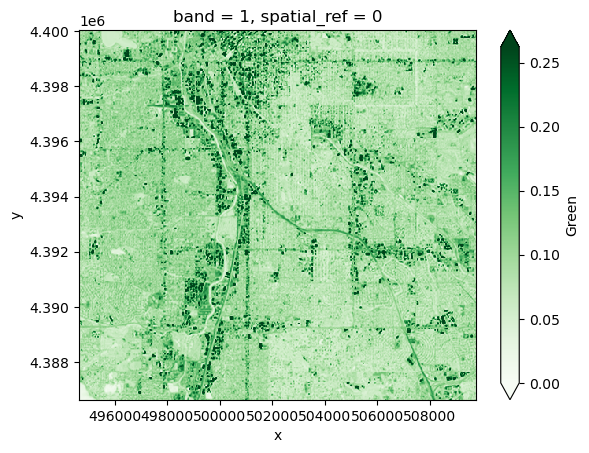

In [13]:
# Find the path to the green layer

greenband_path=glob(os.path.join(rasterdata_dir, '*B03.tif'))[0]
# Open the green data in Python
green_da = rxr.open_rasterio(greenband_path,  mask_and_scale=True).squeeze()
display(green_da)
green_da.plot(cmap='Greens', vmin=0, robust=True)

<xarray.DataArray (y: 447, x: 504)> Size: 901kB
[225288 values with dtype=float32]
Coordinates:
    band         int64 8B 1
  * x            (x) float64 4kB 4.947e+05 4.947e+05 ... 5.097e+05 5.097e+05
  * y            (y) float64 4kB 4.4e+06 4.4e+06 4.4e+06 ... 4.387e+06 4.387e+06
    spatial_ref  int64 8B 0
Attributes: (12/33)
    ACCODE:                    Lasrc; Lasrc
    arop_ave_xshift(meters):   0, 0
    arop_ave_yshift(meters):   0, 0
    arop_ncp:                  0, 0
    arop_rmse(meters):         0, 0
    arop_s2_refimg:            NONE
    ...                        ...
    TIRS_SSM_MODEL:            UNKNOWN; UNKNOWN
    TIRS_SSM_POSITION_STATUS:  UNKNOWN; UNKNOWN
    ULX:                       399960
    ULY:                       4400040
    USGS_SOFTWARE:             LPGS_16.3.0
    AREA_OR_POINT:             Area

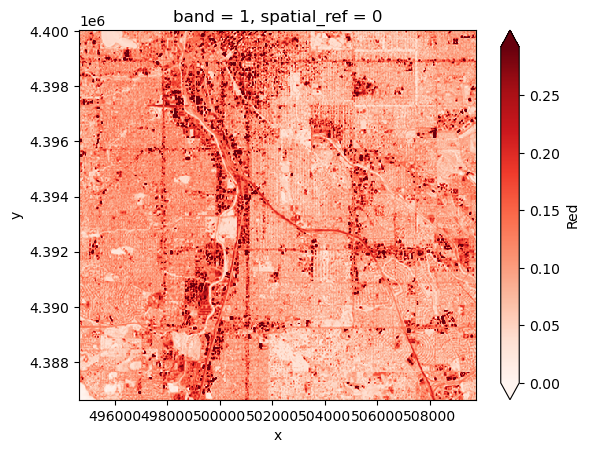

In [14]:
redband_path=glob(os.path.join(rasterdata_dir, '*B04.tif'))[0]
# Open the green data in Python
red_da = rxr.open_rasterio(redband_path, mask_and_scale=True).squeeze()
display(red_da)
red_da.plot(cmap='Reds', vmin=0, robust=True)

<xarray.DataArray (y: 447, x: 504)> Size: 901kB
[225288 values with dtype=float32]
Coordinates:
    band         int64 8B 1
  * x            (x) float64 4kB 4.947e+05 4.947e+05 ... 5.097e+05 5.097e+05
  * y            (y) float64 4kB 4.4e+06 4.4e+06 4.4e+06 ... 4.387e+06 4.387e+06
    spatial_ref  int64 8B 0
Attributes: (12/33)
    ACCODE:                    Lasrc; Lasrc
    arop_ave_xshift(meters):   0, 0
    arop_ave_yshift(meters):   0, 0
    arop_ncp:                  0, 0
    arop_rmse(meters):         0, 0
    arop_s2_refimg:            NONE
    ...                        ...
    TIRS_SSM_MODEL:            UNKNOWN; UNKNOWN
    TIRS_SSM_POSITION_STATUS:  UNKNOWN; UNKNOWN
    ULX:                       399960
    ULY:                       4400040
    USGS_SOFTWARE:             LPGS_16.3.0
    AREA_OR_POINT:             Area

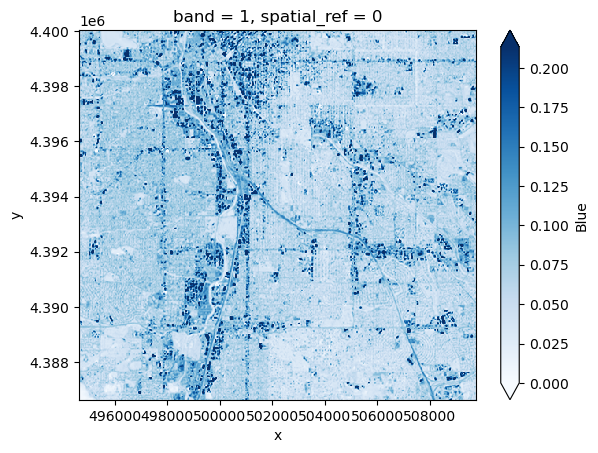

In [15]:
blueband_path=glob(os.path.join(rasterdata_dir, '*B02.tif'))[0]
# Open the green data in Python
blue_da = rxr.open_rasterio(blueband_path, mask_and_scale=True).squeeze()
display(blue_da)
blue_da.plot(cmap='Blues', vmin=0, robust=True)

### Cloud mask

In your original image, you may have noticed some splotches on the
image. These are clouds, and sometimes you will also see darker areas
next to them, which are cloud shadows. Ideally, we don’t want to include
either clouds or the shadows in our image! Luckily, our data comes with
a cloud mask file, labeled as the `Fmask` band.

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It: Take a look at the cloud mask</div></div><div class="callout-body-container callout-body"><ol type="1">
<li>Locate the <code>Fmask</code> file.</li>
<li>Load the <code>Fmask</code> layer into Python</li>
<li>Crop the <code>Fmask</code> layer</li>
<li>Plot the <code>Fmask</code> layer</li>
</ol></div></div>

Notice that your Fmask layer seems to range from 0 to somewhere in the
mid-200s. Our cloud mask actually comes as 8-bit **binary** numbers,
where each **bit** represents a different category of pixel we might
want to mask out.

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It: Process the Fmask</div></div><div class="callout-body-container callout-body"><ol type="1">
<li>Use the sample code below to <strong>unpack</strong> the cloud mask
data. Using <code>bitorder='little'</code> means that the bit indices
will match the Fmask categories in the User Guide, and
<code>axis=-1</code> creates a new dimension for the bits so that now
our array is <code>x</code>x<code>y</code>x8.</li>
<li>Look up the bits to mask in the User Guide. You should mask clouds,
adjacent to clouds, and cloud shadow, as well as water (because water
may confuse our greenspace analogy)</li>
</ol></div></div>

<xarray.DataArray (y: 447, x: 504)> Size: 901kB
[225288 values with dtype=float32]
Coordinates:
    band         int64 8B 1
  * x            (x) float64 4kB 4.947e+05 4.947e+05 ... 5.097e+05 5.097e+05
  * y            (y) float64 4kB 4.4e+06 4.4e+06 4.4e+06 ... 4.387e+06 4.387e+06
    spatial_ref  int64 8B 0
Attributes: (12/33)
    ACCODE:                    Lasrc; Lasrc
    arop_ave_xshift(meters):   0, 0
    arop_ave_yshift(meters):   0, 0
    arop_ncp:                  0, 0
    arop_rmse(meters):         0, 0
    arop_s2_refimg:            NONE
    ...                        ...
    TIRS_SSM_MODEL:            UNKNOWN; UNKNOWN
    TIRS_SSM_POSITION_STATUS:  UNKNOWN; UNKNOWN
    ULX:                       399960
    ULY:                       4400040
    USGS_SOFTWARE:             LPGS_16.3.0
    AREA_OR_POINT:             Area

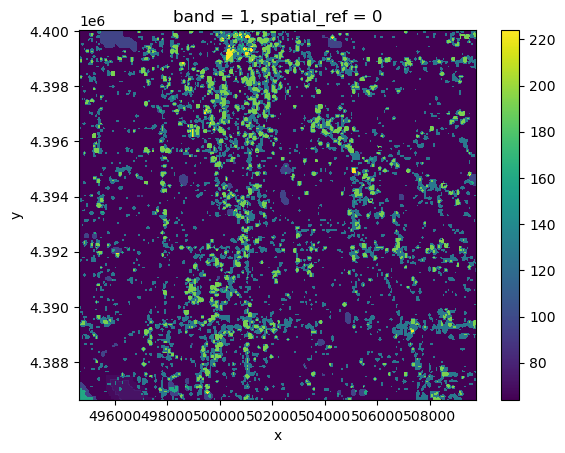

In [16]:
fmask_path=glob(os.path.join(rasterdata_dir, '*Fmask.tif'))[0]
# Open the cloud data in Python
fmask_da = rxr.open_rasterio(fmask_path, mask_and_scale=True).squeeze()
display(fmask_da)
fmask_da.plot()

In [17]:
cloud_bits = (
    np.unpackbits(
        (
            # Get the cloud mask as an array...
            fmask_da.values
            # ... of 8-bit integers
            .astype('uint8')
            # With an extra axis to unpack the bits into
            [:, :, np.newaxis]
        ), 
        # List the least significat bit first to match the user guide
        bitorder='little',
        # Expand the array in a new dimension
        axis=-1)
)

bits_to_mask = [
    1, # Cloud
    2, # Adjacent to cloud
    3, # Cloud shadow
    5] # Water
cloud_mask = np.sum(
    # Select bits 1, 2, and 3, 5
    cloud_bits[:,:,bits_to_mask], 
    # Sum along the bit axis
    axis=-1
# Check if any of bits 1, 2, or 3 are true
)
cloud_mask =cloud_mask== 0

cloud_mask

array([[ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       ...,
       [False, False, False, ...,  True,  True,  True],
       [False, False, False, ...,  True,  True,  True],
       [False, False, False, ...,  True,  True,  True]])

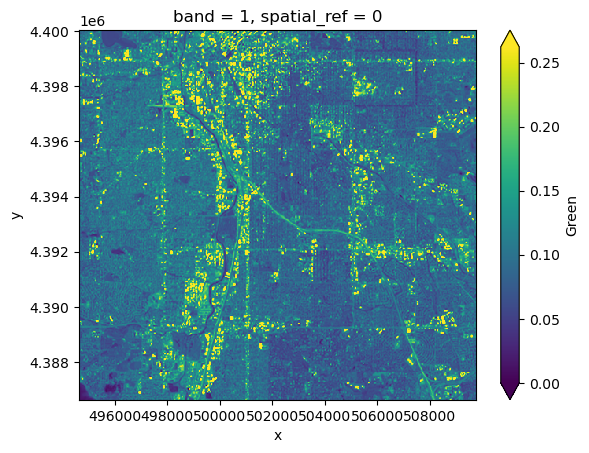

In [18]:
green_masked_da=green_da.where(cloud_mask, green_da.rio.nodata)
green_da.plot(cmap='viridis', vmin=0, robust=True)

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It: Apply the cloud mask</div></div><div class="callout-body-container callout-body"><ol type="1">
<li>Use the <code>.where()</code> method to remove all the pixels you
identified in the previous step from your green reflectance
<code>DataArray</code>.</li>
</ol></div></div>

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It: Load all bands</div></div><div class="callout-body-container callout-body"><p>The sample data comes with 15 different bands. Some of these are
spectral bands, while others are things like a cloud mask, or the angles
from which the image was taken. You only need the spectral bands.
Luckily, all the spectral bands have similar file names, so you can use
<strong>indices</strong> to extract which band is which from the
name:</p>
<ol type="1">
<li>Fill out the <code>bands</code> dictionary based on the User Guide.
You will use this to replace band numbers from the file name with
human-readable names.</li>
<li>Locate the position of the band id number in the file path. It is
easiest to do this from the end, with negative indices. Fill out the
<code>start_index</code> and <code>end_index</code> variables with the
position values. You might need to test this before moving on!</li>
<li>Add code to open up the band in the spot to save it to the
<code>band_dict</code></li>
</ol></div></div>

C:\Users\arago\earth-analytics\data\redlining\rasterdata\HLS.L30.T13SDD.2023193T173653.v2.0.B01.tif
B01
aerosol


<xarray.DataArray (y: 447, x: 504)> Size: 901kB
array([[0.0516    , 0.0686    , 0.0611    , ..., 0.0684    , 0.0598    ,
        0.0395    ],
       [0.0515    , 0.06439999, 0.0489    , ..., 0.0724    , 0.0675    ,
        0.0445    ],
       [0.0616    , 0.0581    , 0.0534    , ..., 0.0728    , 0.0616    ,
        0.0495    ],
       ...,
       [       nan,        nan,        nan, ..., 0.0633    , 0.0405    ,
        0.0395    ],
       [       nan,        nan,        nan, ..., 0.05      , 0.0359    ,
        0.0308    ],
       [       nan,        nan,        nan, ..., 0.0521    , 0.0489    ,
        0.0512    ]], dtype=float32)
Coordinates:
    band         int64 8B 1
  * x            (x) float64 4kB 4.947e+05 4.947e+05 ... 5.097e+05 5.097e+05
  * y            (y) float64 4kB 4.4e+06 4.4e+06 4.4e+06 ... 4.387e+06 4.387e+06
    spatial_ref  int64 8B 0
Attributes: (12/33)
    ACCODE:                    Lasrc; Lasrc
    arop_ave_xshift(meters):   0, 0
    arop_ave_yshift(meters):   0, 0
    arop_ncp:                  0, 0
    arop_rmse(meters):         0, 0
    arop_s2_refimg:            NONE
    ...                        ...
    TIRS_SSM_MODEL:            UNKNOWN; UNKNOWN
    TIRS_SSM_POSITION_STATUS:  UNKNOWN; UNKNOWN
    ULX:                       399960
    ULY:                       4400040
    USGS_SOFTWARE:             LPGS_16.3.0
    AREA_OR_POINT:             Area

C:\Users\arago\earth-analytics\data\redlining\rasterdata\HLS.L30.T13SDD.2023193T173653.v2.0.B02.tif
B02
blue


<xarray.DataArray (y: 447, x: 504)> Size: 901kB
array([[0.0567, 0.0757, 0.0682, ..., 0.0837, 0.0744, 0.0529],
       [0.0575, 0.0726, 0.0559, ..., 0.0907, 0.0849, 0.0605],
       [0.07  , 0.0672, 0.0625, ..., 0.0949, 0.0826, 0.0674],
       ...,
       [   nan,    nan,    nan, ..., 0.0712, 0.0498, 0.0477],
       [   nan,    nan,    nan, ..., 0.0565, 0.0412, 0.0382],
       [   nan,    nan,    nan, ..., 0.0602, 0.0575, 0.061 ]],
      dtype=float32)
Coordinates:
    band         int64 8B 1
  * x            (x) float64 4kB 4.947e+05 4.947e+05 ... 5.097e+05 5.097e+05
  * y            (y) float64 4kB 4.4e+06 4.4e+06 4.4e+06 ... 4.387e+06 4.387e+06
    spatial_ref  int64 8B 0
Attributes: (12/33)
    ACCODE:                    Lasrc; Lasrc
    arop_ave_xshift(meters):   0, 0
    arop_ave_yshift(meters):   0, 0
    arop_ncp:                  0, 0
    arop_rmse(meters):         0, 0
    arop_s2_refimg:            NONE
    ...                        ...
    TIRS_SSM_MODEL:            UNKNOWN; UNKNOWN
    TIRS_SSM_POSITION_STATUS:  UNKNOWN; UNKNOWN
    ULX:                       399960
    ULY:                       4400040
    USGS_SOFTWARE:             LPGS_16.3.0
    AREA_OR_POINT:             Area

C:\Users\arago\earth-analytics\data\redlining\rasterdata\HLS.L30.T13SDD.2023193T173653.v2.0.B03.tif
B03
green


<xarray.DataArray (y: 447, x: 504)> Size: 901kB
array([[0.079     , 0.0998    , 0.09      , ..., 0.12019999, 0.1046    ,
        0.0871    ],
       [0.0806    , 0.09649999, 0.0861    , ..., 0.1278    , 0.1165    ,
        0.0969    ],
       [0.0963    , 0.092     , 0.0857    , ..., 0.1362    , 0.1266    ,
        0.1076    ],
       ...,
       [       nan,        nan,        nan, ..., 0.1067    , 0.0778    ,
        0.06659999],
       [       nan,        nan,        nan, ..., 0.0814    , 0.0635    ,
        0.0623    ],
       [       nan,        nan,        nan, ..., 0.0839    , 0.0891    ,
        0.0946    ]], dtype=float32)
Coordinates:
    band         int64 8B 1
  * x            (x) float64 4kB 4.947e+05 4.947e+05 ... 5.097e+05 5.097e+05
  * y            (y) float64 4kB 4.4e+06 4.4e+06 4.4e+06 ... 4.387e+06 4.387e+06
    spatial_ref  int64 8B 0
Attributes: (12/33)
    ACCODE:                    Lasrc; Lasrc
    arop_ave_xshift(meters):   0, 0
    arop_ave_yshift(meters):   0, 0
    arop_ncp:                  0, 0
    arop_rmse(meters):         0, 0
    arop_s2_refimg:            NONE
    ...                        ...
    TIRS_SSM_MODEL:            UNKNOWN; UNKNOWN
    TIRS_SSM_POSITION_STATUS:  UNKNOWN; UNKNOWN
    ULX:                       399960
    ULY:                       4400040
    USGS_SOFTWARE:             LPGS_16.3.0
    AREA_OR_POINT:             Area

C:\Users\arago\earth-analytics\data\redlining\rasterdata\HLS.L30.T13SDD.2023193T173653.v2.0.B04.tif
B04
red


<xarray.DataArray (y: 447, x: 504)> Size: 901kB
array([[0.0805    , 0.103     , 0.0916    , ..., 0.1369    , 0.1196    ,
        0.0893    ],
       [0.0839    , 0.1052    , 0.0878    , ..., 0.1387    , 0.13069999,
        0.1042    ],
       [0.1028    , 0.10399999, 0.0924    , ..., 0.1505    , 0.14039999,
        0.1166    ],
       ...,
       [       nan,        nan,        nan, ..., 0.1143    , 0.0779    ,
        0.065     ],
       [       nan,        nan,        nan, ..., 0.0841    , 0.0551    ,
        0.0563    ],
       [       nan,        nan,        nan, ..., 0.08859999, 0.0917    ,
        0.1003    ]], dtype=float32)
Coordinates:
    band         int64 8B 1
  * x            (x) float64 4kB 4.947e+05 4.947e+05 ... 5.097e+05 5.097e+05
  * y            (y) float64 4kB 4.4e+06 4.4e+06 4.4e+06 ... 4.387e+06 4.387e+06
    spatial_ref  int64 8B 0
Attributes: (12/33)
    ACCODE:                    Lasrc; Lasrc
    arop_ave_xshift(meters):   0, 0
    arop_ave_yshift(meters):   0, 0
    arop_ncp:                  0, 0
    arop_rmse(meters):         0, 0
    arop_s2_refimg:            NONE
    ...                        ...
    TIRS_SSM_MODEL:            UNKNOWN; UNKNOWN
    TIRS_SSM_POSITION_STATUS:  UNKNOWN; UNKNOWN
    ULX:                       399960
    ULY:                       4400040
    USGS_SOFTWARE:             LPGS_16.3.0
    AREA_OR_POINT:             Area

C:\Users\arago\earth-analytics\data\redlining\rasterdata\HLS.L30.T13SDD.2023193T173653.v2.0.B05.tif
B05
nir


<xarray.DataArray (y: 447, x: 504)> Size: 901kB
array([[0.2572    , 0.2899    , 0.281     , ..., 0.2094    , 0.19569999,
        0.2536    ],
       [0.2615    , 0.261     , 0.2683    , ..., 0.26549998, 0.2147    ,
        0.2463    ],
       [0.2497    , 0.22469999, 0.2395    , ..., 0.2811    , 0.2778    ,
        0.2512    ],
       ...,
       [       nan,        nan,        nan, ..., 0.2121    , 0.23799999,
        0.27019998],
       [       nan,        nan,        nan, ..., 0.24229999, 0.2877    ,
        0.2963    ],
       [       nan,        nan,        nan, ..., 0.2607    , 0.2925    ,
        0.2895    ]], dtype=float32)
Coordinates:
    band         int64 8B 1
  * x            (x) float64 4kB 4.947e+05 4.947e+05 ... 5.097e+05 5.097e+05
  * y            (y) float64 4kB 4.4e+06 4.4e+06 4.4e+06 ... 4.387e+06 4.387e+06
    spatial_ref  int64 8B 0
Attributes: (12/33)
    ACCODE:                    Lasrc; Lasrc
    arop_ave_xshift(meters):   0, 0
    arop_ave_yshift(meters):   0, 0
    arop_ncp:                  0, 0
    arop_rmse(meters):         0, 0
    arop_s2_refimg:            NONE
    ...                        ...
    TIRS_SSM_MODEL:            UNKNOWN; UNKNOWN
    TIRS_SSM_POSITION_STATUS:  UNKNOWN; UNKNOWN
    ULX:                       399960
    ULY:                       4400040
    USGS_SOFTWARE:             LPGS_16.3.0
    AREA_OR_POINT:             Area

C:\Users\arago\earth-analytics\data\redlining\rasterdata\HLS.L30.T13SDD.2023193T173653.v2.0.B06.tif
B06
swirl


<xarray.DataArray (y: 447, x: 504)> Size: 901kB
array([[0.1779    , 0.2008    , 0.1934    , ..., 0.203     , 0.16849999,
        0.1718    ],
       [0.17289999, 0.1821    , 0.18689999, ..., 0.2278    , 0.1994    ,
        0.20289999],
       [0.1872    , 0.18419999, 0.19219999, ..., 0.23709999, 0.2276    ,
        0.2183    ],
       ...,
       [       nan,        nan,        nan, ..., 0.1829    , 0.1653    ,
        0.16399999],
       [       nan,        nan,        nan, ..., 0.17289999, 0.1651    ,
        0.1617    ],
       [       nan,        nan,        nan, ..., 0.181     , 0.1882    ,
        0.18949999]], dtype=float32)
Coordinates:
    band         int64 8B 1
  * x            (x) float64 4kB 4.947e+05 4.947e+05 ... 5.097e+05 5.097e+05
  * y            (y) float64 4kB 4.4e+06 4.4e+06 4.4e+06 ... 4.387e+06 4.387e+06
    spatial_ref  int64 8B 0
Attributes: (12/33)
    ACCODE:                    Lasrc; Lasrc
    arop_ave_xshift(meters):   0, 0
    arop_ave_yshift(meters):   0, 0
    arop_ncp:                  0, 0
    arop_rmse(meters):         0, 0
    arop_s2_refimg:            NONE
    ...                        ...
    TIRS_SSM_MODEL:            UNKNOWN; UNKNOWN
    TIRS_SSM_POSITION_STATUS:  UNKNOWN; UNKNOWN
    ULX:                       399960
    ULY:                       4400040
    USGS_SOFTWARE:             LPGS_16.3.0
    AREA_OR_POINT:             Area

C:\Users\arago\earth-analytics\data\redlining\rasterdata\HLS.L30.T13SDD.2023193T173653.v2.0.B07.tif
B07
swir2


<xarray.DataArray (y: 447, x: 504)> Size: 901kB
array([[0.1218    , 0.1363    , 0.13059999, ..., 0.17199999, 0.1457    ,
        0.12789999],
       [0.1232    , 0.134     , 0.12709999, ..., 0.184     , 0.1707    ,
        0.16049999],
       [0.1466    , 0.14209999, 0.1413    , ..., 0.2006    , 0.18679999,
        0.17539999],
       ...,
       [       nan,        nan,        nan, ..., 0.146     , 0.1118    ,
        0.1011    ],
       [       nan,        nan,        nan, ..., 0.124     , 0.0954    ,
        0.0902    ],
       [       nan,        nan,        nan, ..., 0.1309    , 0.1268    ,
        0.1328    ]], dtype=float32)
Coordinates:
    band         int64 8B 1
  * x            (x) float64 4kB 4.947e+05 4.947e+05 ... 5.097e+05 5.097e+05
  * y            (y) float64 4kB 4.4e+06 4.4e+06 4.4e+06 ... 4.387e+06 4.387e+06
    spatial_ref  int64 8B 0
Attributes: (12/33)
    ACCODE:                    Lasrc; Lasrc
    arop_ave_xshift(meters):   0, 0
    arop_ave_yshift(meters):   0, 0
    arop_ncp:                  0, 0
    arop_rmse(meters):         0, 0
    arop_s2_refimg:            NONE
    ...                        ...
    TIRS_SSM_MODEL:            UNKNOWN; UNKNOWN
    TIRS_SSM_POSITION_STATUS:  UNKNOWN; UNKNOWN
    ULX:                       399960
    ULY:                       4400040
    USGS_SOFTWARE:             LPGS_16.3.0
    AREA_OR_POINT:             Area

C:\Users\arago\earth-analytics\data\redlining\rasterdata\HLS.L30.T13SDD.2023193T173653.v2.0.B09.tif
B09
cirrus


<xarray.DataArray (y: 447, x: 504)> Size: 901kB
array([[0.0012, 0.0011, 0.0012, ..., 0.0012, 0.0012, 0.0013],
       [0.0011, 0.0011, 0.0012, ..., 0.0012, 0.0015, 0.0015],
       [0.0012, 0.0011, 0.0011, ..., 0.0013, 0.0014, 0.0015],
       ...,
       [   nan,    nan,    nan, ..., 0.0012, 0.0011, 0.0012],
       [   nan,    nan,    nan, ..., 0.0008, 0.0009, 0.001 ],
       [   nan,    nan,    nan, ..., 0.0007, 0.0009, 0.001 ]],
      dtype=float32)
Coordinates:
    band         int64 8B 1
  * x            (x) float64 4kB 4.947e+05 4.947e+05 ... 5.097e+05 5.097e+05
  * y            (y) float64 4kB 4.4e+06 4.4e+06 4.4e+06 ... 4.387e+06 4.387e+06
    spatial_ref  int64 8B 0
Attributes: (12/33)
    ACCODE:                    Lasrc; Lasrc
    arop_ave_xshift(meters):   0, 0
    arop_ave_yshift(meters):   0, 0
    arop_ncp:                  0, 0
    arop_rmse(meters):         0, 0
    arop_s2_refimg:            NONE
    ...                        ...
    TIRS_SSM_MODEL:            UNKNOWN; UNKNOWN
    TIRS_SSM_POSITION_STATUS:  UNKNOWN; UNKNOWN
    ULX:                       399960
    ULY:                       4400040
    USGS_SOFTWARE:             LPGS_16.3.0
    AREA_OR_POINT:             Area

C:\Users\arago\earth-analytics\data\redlining\rasterdata\HLS.L30.T13SDD.2023193T173653.v2.0.B10.tif
B10
thermal


<xarray.DataArray (y: 447, x: 504)> Size: 901kB
array([[39.36    , 38.809998, 38.69    , ..., 41.26    , 41.07    ,
        41.      ],
       [39.51    , 38.98    , 38.87    , ..., 41.59    , 41.3     ,
        41.09    ],
       [39.61    , 39.18    , 39.059998, ..., 41.57    , 41.29    ,
        41.01    ],
       ...,
       [      nan,       nan,       nan, ..., 38.2     , 38.129997,
        38.12    ],
       [      nan,       nan,       nan, ..., 38.39    , 38.39    ,
        38.379997],
       [      nan,       nan,       nan, ..., 38.69    , 38.78    ,
        38.82    ]], dtype=float32)
Coordinates:
    band         int64 8B 1
  * x            (x) float64 4kB 4.947e+05 4.947e+05 ... 5.097e+05 5.097e+05
  * y            (y) float64 4kB 4.4e+06 4.4e+06 4.4e+06 ... 4.387e+06 4.387e+06
    spatial_ref  int64 8B 0
Attributes: (12/34)
    ACCODE:                    Lasrc; Lasrc
    arop_ave_xshift(meters):   0, 0
    arop_ave_yshift(meters):   0, 0
    arop_ncp:                  0, 0
    arop_rmse(meters):         0, 0
    arop_s2_refimg:            NONE
    ...                        ...
    TIRS_SSM_POSITION_STATUS:  UNKNOWN; UNKNOWN
    ULX:                       399960
    ULY:                       4400040
    unit:                      Celsius
    USGS_SOFTWARE:             LPGS_16.3.0
    AREA_OR_POINT:             Area

C:\Users\arago\earth-analytics\data\redlining\rasterdata\HLS.L30.T13SDD.2023193T173653.v2.0.B11.tif
B11
thermal2


<xarray.DataArray (y: 447, x: 504)> Size: 901kB
array([[37.329998, 36.829998, 36.76    , ..., 39.629997, 39.469997,
        39.399998],
       [37.45    , 36.989998, 36.95    , ..., 39.71    , 39.6     ,
        39.54    ],
       [37.51    , 37.149998, 37.1     , ..., 39.51    , 39.469997,
        39.46    ],
       ...,
       [      nan,       nan,       nan, ..., 36.6     , 36.71    ,
        36.79    ],
       [      nan,       nan,       nan, ..., 36.67    , 36.82    ,
        36.93    ],
       [      nan,       nan,       nan, ..., 36.84    , 36.969997,
        37.09    ]], dtype=float32)
Coordinates:
    band         int64 8B 1
  * x            (x) float64 4kB 4.947e+05 4.947e+05 ... 5.097e+05 5.097e+05
  * y            (y) float64 4kB 4.4e+06 4.4e+06 4.4e+06 ... 4.387e+06 4.387e+06
    spatial_ref  int64 8B 0
Attributes: (12/34)
    ACCODE:                    Lasrc; Lasrc
    arop_ave_xshift(meters):   0, 0
    arop_ave_yshift(meters):   0, 0
    arop_ncp:                  0, 0
    arop_rmse(meters):         0, 0
    arop_s2_refimg:            NONE
    ...                        ...
    TIRS_SSM_POSITION_STATUS:  UNKNOWN; UNKNOWN
    ULX:                       399960
    ULY:                       4400040
    unit:                      Celsius
    USGS_SOFTWARE:             LPGS_16.3.0
    AREA_OR_POINT:             Area

{'aerosol': <xarray.DataArray (y: 447, x: 504)> Size: 901kB
 array([[0.0516    , 0.0686    , 0.0611    , ..., 0.0684    , 0.0598    ,
         0.0395    ],
        [0.0515    , 0.06439999, 0.0489    , ..., 0.0724    , 0.0675    ,
         0.0445    ],
        [0.0616    , 0.0581    , 0.0534    , ..., 0.0728    , 0.0616    ,
         0.0495    ],
        ...,
        [       nan,        nan,        nan, ..., 0.0633    , 0.0405    ,
         0.0395    ],
        [       nan,        nan,        nan, ..., 0.05      , 0.0359    ,
         0.0308    ],
        [       nan,        nan,        nan, ..., 0.0521    , 0.0489    ,
         0.0512    ]], dtype=float32)
 Coordinates:
     band         int64 8B 1
   * x            (x) float64 4kB 4.947e+05 4.947e+05 ... 5.097e+05 5.097e+05
   * y            (y) float64 4kB 4.4e+06 4.4e+06 4.4e+06 ... 4.387e+06 4.387e+06
     spatial_ref  int64 8B 0
 Attributes: (12/33)
     ACCODE:                    Lasrc; Lasrc
     arop_ave_xshift(meters):   0, 0


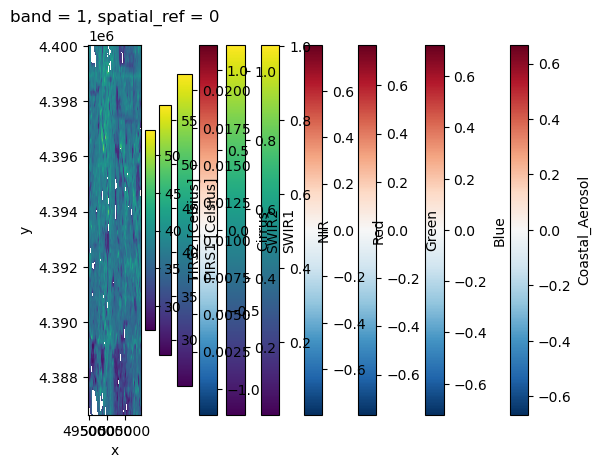

In [19]:
# Define band labels
bands = {
    'B01': 'aerosol',
    'B02':'blue',
    'B03':'green',
    'B04':'red',
    'B05':'nir',
    'B06':'swirl',
    'B07':'swir2',
    'B09':'cirrus',
    'B10':'thermal',
    'B11':'thermal2'
    
}

band_dict = {}
band_paths = glob(os.path.join(rasterdata_dir, '*.B*.tif'))
for band_path in band_paths:
    print(band_path)


    # Get the band number and name

    start_index =-7 
    end_index = -4
    band_id = band_path[start_index:end_index]
    print(band_id)
    band_name=bands[band_id]
    print(band_name)
    #band_name = bands[band_id]

    # Open the band and accumulate
    band_da=rxr.open_rasterio(band_path, mask_and_scale=True ).squeeze()
    #display(masked_da)
    masked_da=band_da.where(cloud_mask)
    display(masked_da)
    masked_da.plot()

    #accumulate
    band_dict[band_name] = masked_da
    
   
band_dict



In [20]:
import re
import matplotlib.pyplot as plt

 
# ax = [5, 2] 
# figsize=[10, 15]
# band_re = re.compile(r"(?P<band_id>[a-z]+).tif")

# #plot the bands
# band_dict[band_name].plot(ax=subplots)
# plt.subplots.set(title='')
# plt.subplots.axis('off')

In [21]:
band_dict['green'].rio

In [22]:
ndvi_da.rio

In [23]:
%store band_dict

Stored 'band_dict' (dict)


# Spectral Indices

## Observing vegetation health from space

When working with multispectral data, the individual reflectance values
do not tell us much, but their relationships do. A normalized **spectral
index** is a way of measuring the relationship between two (or more)
bands.

We will look vegetation cover using NDVI (Normalized Difference
Vegetation Index). How does it work? First, we need to learn about
spectral reflectance signatures.

Every object reflects some wavelengths of light more or less than
others. We can see this with our eyes, since, for example, plants
reflect a lot of green in the summer, and then as that green diminishes
in the fall they look more yellow or orange. The image below shows
spectral signatures for water, soil, and vegetation:

![](https://seos-project.eu/remotesensing/images/Reflexionskurven.jpg)
\> Image source: [SEOS
Project](https://seos-project.eu/remotesensing/remotesensing-c01-p06.html)

**Healthy vegetation** reflects a lot of **Near-InfraRed (NIR)**
radiation. Less healthy vegetation reflects a similar amounts of the
visible light spectra, but less NIR radiation. We don’t see a huge drop
in Green radiation until the plant is very stressed or dead. That means
that NIR allows us to get ahead of what we can see with our eyes.

![Healthy leaves reflect a lot of NIR radiation compared to dead or
stressed
leaves](attachment:../../img/earth-analytics/remote-sensing/spectral_vegetation_stress.png)
\> Image source: [Spectral signature literature review by
px39n](https://github.com/px39n/Awesome-Vegetation-Index)

Different species of plants reflect different spectral signatures, but
the *pattern* of the signatures are similar. NDVI compares the amount of
NIR reflectance to the amount of Red reflectance, thus accounting for
many of the species differences and isolating the health of the plant.
The formula for calculating NDVI is:

$$NDVI = \frac{(NIR - Red)}{(NIR + Red)}$$

Read more about NDVI and other vegetation indices:

-   [earthdatascience.org](https://www.earthdatascience.org/courses/use-data-open-source-python/multispectral-remote-sensing/vegetation-indices-in-python/calculate-NDVI-python/)
-   [USGS](https://www.usgs.gov/landsat-missions/landsat-surface-reflectance-derived-spectral-indices)

In [24]:
store -r band_dict

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It: Calculate NDVI</div></div><div class="callout-body-container callout-body"></div></div>

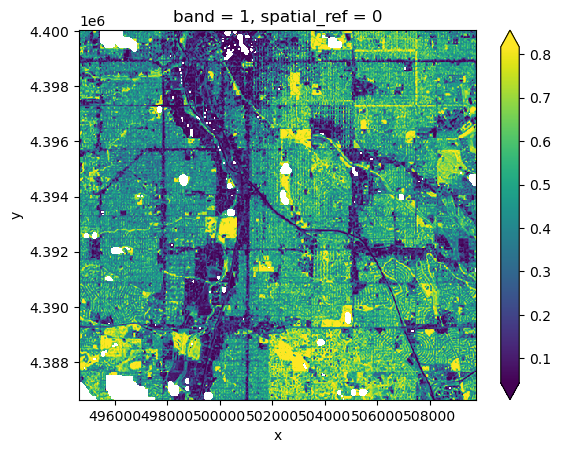

In [25]:
#1:38:41
ndvi_da = (
    (band_dict['nir'] - band_dict['red']) / (band_dict['nir'] + band_dict['red'])
)
ndvi_da.plot(robust=True)

In [ ]:
#band_dict['nir'].rio.nodata

In [26]:
%store ndvi_da

Stored 'ndvi_da' (DataArray)


<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-extra"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Looking for an Extra Challenge?: Calculate another index</div></div><div class="callout-body-container callout-body"><p>You can also calculating other indices that you find on the internet
or in the scientific literature. Some common ones in this context might
be the NDMI (moisture), NDBaI (bareness), or the NDBI (built-up).</p></div></div>

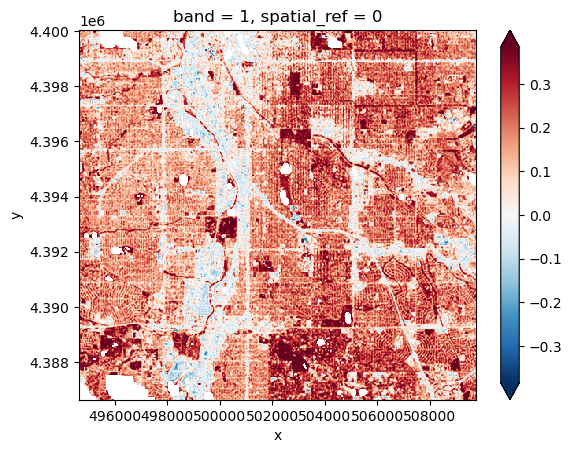

In [27]:
#NDMI calculation

ndmi_da = (band_dict['nir'] - band_dict['swirl']) / (band_dict['nir'] + band_dict['swirl'])
                                                    

ndmi_da.plot(robust=True)

# Plotting multispectral data

Multispectral data can be plotted as:

1.  Individual bands
2.  Spectral indices
3.  True color 3-band images
4.  False color 3-band images

Spectral indices and false color images can both be used to enhance
images to clearly show things that might be hidden from a true color
image, such as vegetation health.

In [28]:
%store -r band_dict ndvi_da den_redlining_gdf

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It: Import libraries</div></div><div class="callout-body-container callout-body"><p>Add missing libraries to the imports</p></div></div>

In [29]:
import cartopy.crs as ccrs # CRSs
# Interactive tabular and vector data
import hvplot.xarray # Interactive raster
# Overlay plots
import numpy as np # Adjust images
import xarray as xr # Adjust images

import matplotlib.pyplot as plt
import pandas as pd
import geopandas as gpd
import hvplot.pandas


There are many different ways to represent geospatial coordinates,
either spherically or on a flat map. These different systems are called
Coordinate Reference Systems.

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It: Prepare to plot</div></div><div class="callout-body-container callout-body"><p>To make interactive geospatial plots, at the moment we need
everything to be in the Mercator CRS.</p>
<ol type="1">
<li>Reproject your area of interest with
<code>.to_crs(ccrs.Mercator())</code></li>
<li>Reproject your NDVI and band raster data using
`.rio.reproject(ccrs.Mercator())</li>
</ol></div></div>

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It: Plot raster with overlay with xarray</div></div><div class="callout-body-container callout-body"><p>Plotting raster and vector data together using <code>pandas</code>
and <code>xarray</code> requires the <code>matplotlib.pyplot</code>
library to access some plot layour tools. Using the code below as a
starting point, you can play around with adding:</p>
<ol type="1">
<li>Labels and titles</li>
<li>Different colors with <code>cmap</code> and
<code>edgecolor</code></li>
<li>Different line thickness with <code>line_width</code></li>
</ol>
<p>See if you can also figure out what <code>vmin</code>,
<code>robust</code>, and the <code>.set()</code> methods do.</p></div></div>

In [30]:
import xarray as xr

#repjecting
redlining_plot_gdf = den_redlining_gdf.to_crs(ccrs.Mercator())

#reproject raster data with raster in and out
ndvi_plot_da = ndvi_da.rio.reproject(ccrs.Mercator())

#reproj band dict
band_plot_dict = {
    name: da.rio.reproject(ccrs.Mercator())
    for name, da in band_dict.items()
}



C:\Users\arago\AppData\Local\Temp\ipykernel_16356\2217805051.py:12: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()
c:\Users\arago\miniconda3\envs\earth-analytics-python\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


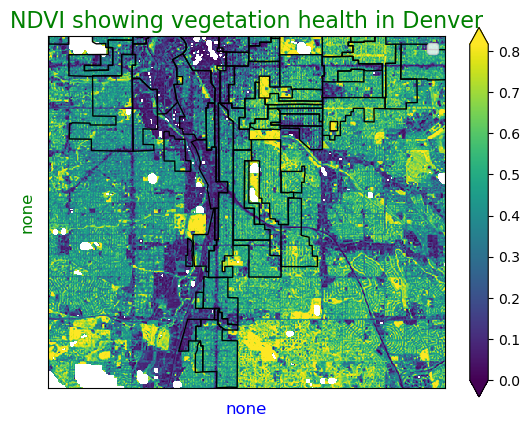

In [31]:
ndvi_plot_da.plot(vmin=0, robust=True)
redlining_plot_gdf.plot(ax=plt.gca(), color='none')
plt.gca().set(
    xlabel='', ylabel='', xticks=[], yticks=[]
)
plt.title("NDVI showing vegetation health in Denver", fontsize=16, color='green', loc='center')

#no axis values
plt.xlabel("none", fontsize=12, color="blue", labelpad=10)  #  x-axis label
plt.ylabel("none", fontsize=12, color="green", labelpad=10)  #  y-axis label

plt.legend()

#desc
# plt.text(2, 20, "NDVI values dark is healthy vegetation and green to yellow is unhealthy to no vegetation.", fontsize=10, color="blue")

plt.show()

vegetation along river shows 0.0 - 0.1 healthy vegeation, indication of healthy vegetation along stream. The yellow and green is within city indicating little to no vegetation within the city of denver due to building and other structures

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It: Plot raster with overlay with hvplot</div></div><div class="callout-body-container callout-body"><p>Now, do the same with <code>hvplot</code>. Note that some parameter
names are the same and some are different. Do you notice any physical
lines in the NDVI data that line up with the redlining boundaries?</p></div></div>

In [32]:
(
    ndvi_plot_da.hvplot(
        geo=True,
        xaxis=None, yaxis=None
    )
    * redlining_plot_gdf.hvplot(
        geo=True, crs=ccrs.Mercator(),
        fill_color=None)
)



:Overlay
   .Image.I    :Image   [x,y]   (value)
   .Polygons.I :Polygons   [Longitude,Latitude]

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It: Plot bands with linked subplots</div></div><div class="callout-body-container callout-body"><p>The following code will make a three panel plot with Red, NIR, and
Green bands. Why do you think we aren’t using the green band to look at
vegetation?</p></div></div>

In [33]:
raster_kwargs = dict(
    geo=True, robust=True, 
    xaxis=None, yaxis=None
)
(
    (
        band_plot_dict['red'].hvplot(
            cmap='Reds', title='Red Reflectance', **raster_kwargs)
        + band_plot_dict['nir'].hvplot(
            cmap='Greys', title='NIR Reflectance', **raster_kwargs)
        + band_plot_dict['green'].hvplot(
            cmap='Greens', title='Green Reflectance', **raster_kwargs)
    )
    * redlining_plot_gdf.hvplot(
        geo=True, crs=ccrs.Mercator(),
        fill_color=None)
)

:Layout
   .Overlay.I   :Overlay
      .Image.I    :Image   [x,y]   (Red)
      .Polygons.I :Polygons   [Longitude,Latitude]
   .Overlay.II  :Overlay
      .Image.I    :Image   [x,y]   (NIR)
      .Polygons.I :Polygons   [Longitude,Latitude]
   .Overlay.III :Overlay
      .Image.I    :Image   [x,y]   (Green)
      .Polygons.I :Polygons   [Longitude,Latitude]

Red is showing red reflectance which represents unhealthy vegetation since healthy vegetation absorbs redlight on the spectrum, and thus will not reflect red. The red indicates unhealthy to no vegeation. The NIR Reflectance should show healthy vegeation where NIR is high reflectance. Along the river should have high NIR reflectance, however, shows low reflectance and not sure why. This also is the case with the green and red refelectance. Along the river should show low red reflectance but in this image shows high red reflectance. Green indicates healthy vegetation since it is being reflected back in thisimage. You can see the healthy vegetation in along the river. 

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It: Plot RBG</div></div><div class="callout-body-container callout-body"><p>The following code will plot an RGB image using both matplotlib and
hvplot. It also performs an action called “Contrast stretching”, and
brightens the image.</p>
<ol type="1">
<li>Read through the <code>stretch_rgb</code> function, and fill out the
<strong>docstring</strong> with the rest of the parameters and your own
descriptions. You can ask ChatGPT or another LLM to help you read the
code if needed! Please use the <a
href="https://numpydoc.readthedocs.io/en/latest/format.html">numpy style
of docstrings</a></li>
<li>Adjust the <code>low</code>, <code>high</code>, and
<code>brighten</code> numbers until you are satisfied with the image.
You can also ask ChatGPT to help you figure out what adjustments to make
by describing or uploading an image.</li>
</ol></div></div>

:RGB   [x,y]   (R,G,B)

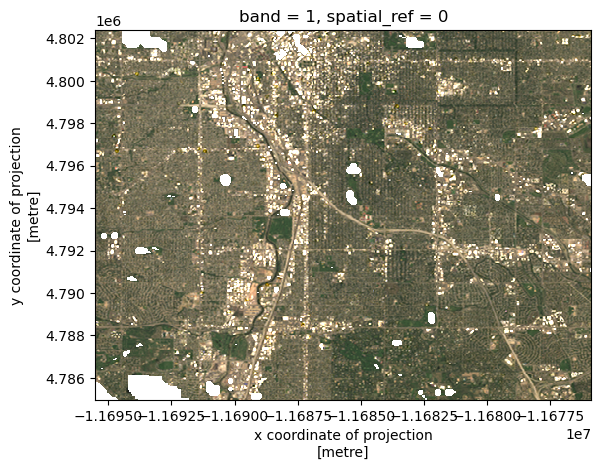

In [34]:
rgb_da = (
    xr.concat(
        [
            band_plot_dict['red'],
            band_plot_dict['green'],
            band_plot_dict['blue']
        ],
        dim='rgb')
)

def stretch_rgb(rgb_da, low, high, brighten):
    """
    Short description: 
    True color Satelite image of the city of Denver. 
    Long description...

    Parameters
    ----------
    rgb_da: array-like
      Where the values are set to show contrast low (1), high(99) and brightest(.2)
    param2: ...
      ...

    Returns
    -------
    rgb_da: array-like
      return rgb_da sends the value to produce the output satelite real color image below. 
    """
    p_low, p_high = np.nanpercentile(rgb_da, (low, high))
    rgb_da = (rgb_da - p_low)  / (p_high - p_low) + brighten
    rgb_da = rgb_da.clip(0, 1)
    return rgb_da

rgb_da = stretch_rgb(rgb_da, 1, 99, .2)

rgb_da.plot.imshow(rgb='rgb')
rgb_da.hvplot.rgb(geo=True, x='x', y='y', bands='rgb')

In [35]:
help(stretch_rgb)

Help on function stretch_rgb in module __main__:

stretch_rgb(rgb_da, low, high, brighten)
    Short description: 
    True color Satelite image of the city of Denver. 
    Long description...
    
    Parameters
    ----------
    rgb_da: array-like
      Where the values are set to show contrast low (1), high(99) and brightest(.2)
    param2: ...
      ...
    
    Returns
    -------
    rgb_da: array-like
      return rgb_da sends the value to produce the output satelite real color image below.



<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It: Plot CIR</div></div><div class="callout-body-container callout-body"><p>Now, plot a false color RGB image. CIR images have the following
bands:</p>
<ul>
<li>red becomes NIR</li>
<li>green becomes red</li>
<li>blue becomes green</li>
</ul></div></div>

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-extra"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Looking for an Extra Challenge?: Adjust the levels</div></div><div class="callout-body-container callout-body"><p>You may notice that the NIR band in this image is very bright. Can
you adjust it so it is balanced more effectively by the other bands?</p></div></div>

:RGB   [x,y]   (R,G,B)

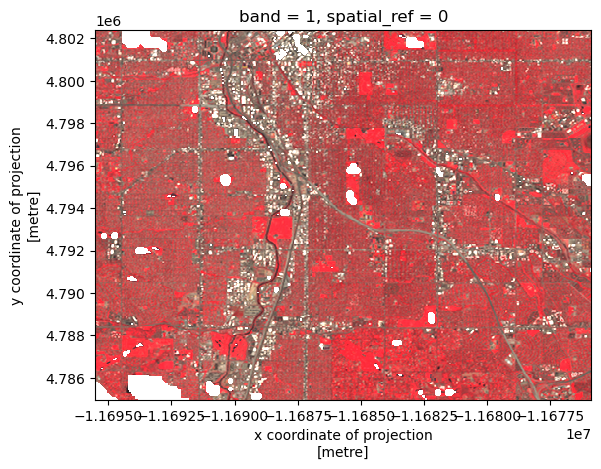

In [36]:
rgb_da = (
    xr.concat(
        [
            band_plot_dict['nir'],
            band_plot_dict['red'],
            band_plot_dict['green']
        ],
        dim='rgb')
)

def stretch_rgb(rgb_da, low, high, brighten):
    """
    Short description: 
    false color Satelite image of the city of Denver. 
    Long description...

    Parameters
    ----------
    rgb_da: array-like
      Where the values are set to show contrast low (1), high(99) and brightest(.2)
    param2: ...
      ...

    Returns
    -------
    rgb_da: array-like
      return rgb_da sends the value to produce the output satelite false color image below. 
    """
    p_low, p_high = np.nanpercentile(rgb_da, (low, high))
    rgb_da = (rgb_da - p_low)  / (p_high - p_low) + brighten
    rgb_da = rgb_da.clip(0, 1)
    return rgb_da

rgb_da = stretch_rgb(rgb_da, 1, 99, .2)

rgb_da.plot.imshow(rgb='rgb')
rgb_da.hvplot.rgb(geo=True, x='x', y='y', bands='rgb')

In [37]:
help(stretch_rgb)

Help on function stretch_rgb in module __main__:

stretch_rgb(rgb_da, low, high, brighten)
    Short description: 
    false color Satelite image of the city of Denver. 
    Long description...
    
    Parameters
    ----------
    rgb_da: array-like
      Where the values are set to show contrast low (1), high(99) and brightest(.2)
    param2: ...
      ...
    
    Returns
    -------
    rgb_da: array-like
      return rgb_da sends the value to produce the output satelite false color image below.



In [38]:
%store den_redlining_gdf ndvi_da

Stored 'den_redlining_gdf' (GeoDataFrame)
Stored 'ndvi_da' (DataArray)


# STEP 6: Calculate zonal statistics

In order to evaluate the connection between vegetation health and
redlining, we need to summarize NDVI across the same geographic areas as
we have redlining information.

First, import variables from previous notebooks:

In [39]:
store -r den_redlining_gdf ndvi_da

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It: Import packages</div></div><div class="callout-body-container callout-body"><p>Some packages are included that will help you calculate statistics
for areas imported below. Add packages for:</p>
<ol type="1">
<li>Interactive plotting of tabular and vector data</li>
<li>Working with categorical data in <code>DataFrame</code>s</li>
</ol></div></div>

In [40]:
import hvplot.pandas
# Interactive plots with pandas
# Ordered categorical data
import regionmask # Convert shapefile to mask
from xrspatial import zonal_stats # Calculate zonal statistics
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import rasterio
import numpy as np


<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It: Convert vector to raster</div></div><div class="callout-body-container callout-body"><p>You can convert your vector data to a raster mask using the
<code>regionmask</code> package. You will need to give
<code>regionmask</code> the geographic coordinates of the grid you are
using for this to work:</p>
<ol type="1">
<li>Replace <code>gdf</code> with your redlining
<code>GeoDataFrame</code>.</li>
<li>Add code to put your <code>GeoDataFrame</code> in the same CRS as
your raster data.</li>
<li>Replace <code>x_coord</code> and <code>y_coord</code> with the x and
y coordinates from your raster data.</li>
</ol></div></div>

<Axes: >

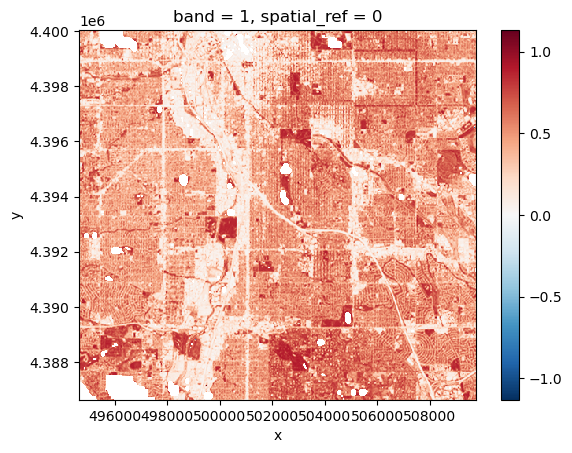

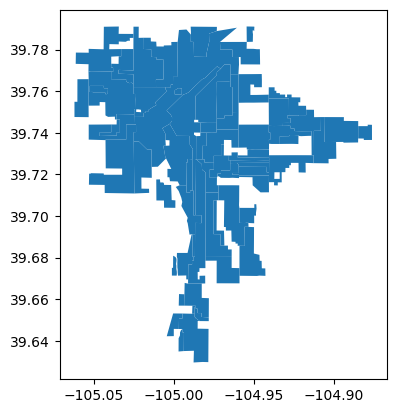

In [41]:
ndvi_da.plot()
den_redlining_gdf.plot()

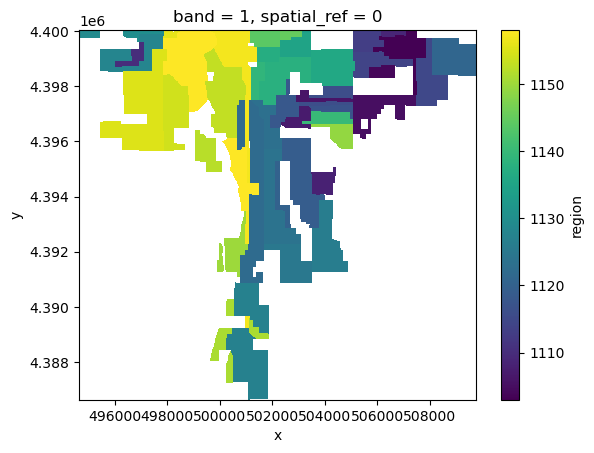

In [42]:
denver_redlining_mask = regionmask.mask_geopandas(
    den_redlining_gdf.to_crs(ndvi_da.rio.crs),
    ndvi_da.x, ndvi_da.y,
    # The regions do not overlap
    overlap=False,
    # We're not using geographic coordinates
    wrap_lon=False
    #gbif_gdf = (
    #gpd.GeoDataFrame(
     #   gbif_df, 
      #  geometry=gpd.points_from_xy(
       #     gbif_df.decimalLongitude, 
        #    gbif_df.decimalLatitude), 
        #crs="ccrs.Mercator")
)
denver_redlining_mask.plot()

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It: Calculate zonal statistics</div></div><div class="callout-body-container callout-body"><p>Calculate zonal status using the <code>zonal_stats()</code> function.
To figure out which arguments it needs, use either the
<code>help()</code> function in Python, or search the internet.</p></div></div>

In [43]:
# Calculate NDVI stats for each redlining zone
#help(zonal_stats)
den_ndvi_zstats=zonal_stats(denver_redlining_mask, ndvi_da)

den_ndvi_zstats



,zone,mean,max,min,sum,std,var,count
0,1103.0,0.594725,0.933680,0.051336,1084.184570,0.112025,0.012550,1823.0
1,1104.0,0.532335,0.751825,0.343143,264.038208,0.076069,0.005787,496.0
2,1105.0,0.551866,0.950300,0.034265,1221.832031,0.132201,0.017477,2214.0
3,1106.0,0.615817,0.880833,0.109626,289.433868,0.095491,0.009119,470.0
4,1107.0,0.578750,0.832567,0.069588,354.194824,0.116065,0.013471,612.0
5,1108.0,0.540381,0.834366,0.098866,412.851105,0.114857,0.013192,764.0
6,1109.0,0.577444,0.768556,0.110282,127.615219,0.095902,0.009197,221.0
7,1110.0,0.321796,0.870176,-0.009210,142.877594,0.132056,0.017439,444.0
8,1113.0,0.570884,0.913526,0.004126,504.661316,0.130895,0.017134,884.0
9,1114.0,0.409973,0.795624,-0.010747,523.535645,0.182436,0.033283,1277.0


In [44]:
help(zonal_stats)

Help on function stats in module xrspatial.zonal:

stats(zones: xarray.core.dataarray.DataArray, values: xarray.core.dataarray.DataArray, zone_ids: Optional[List[Union[int, float]]] = None, stats_funcs: Union[Dict, List] = ['mean', 'max', 'min', 'sum', 'std', 'var', 'count'], nodata_values: Union[int, float] = None, return_type: str = 'pandas.DataFrame') -> Union[pandas.core.frame.DataFrame, dask.dataframe.core.DataFrame, xarray.core.dataarray.DataArray]
    Calculate summary statistics for each zone defined by a `zones`
    dataset, based on `values` aggregate.
    
    A single output value is computed for every zone in the input `zones`
    dataset.
    
    This function currently supports numpy backed, and dask with numpy backed
    xarray DataArrays.
    
    Parameters
    ----------
    zones : xr.DataArray
        zones is a 2D xarray DataArray of numeric values.
        A zone is all the cells in a raster that have the same value,
        whether or not they are contiguous. T

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It: Plot regional statistics</div></div><div class="callout-body-container callout-body"><p>Plot the regional statistics:</p>
<ol type="1">
<li>Merge the NDVI values into the redlining
<code>GeoDataFrame</code>.</li>
<li>Use the code template below to convert the <code>grade</code> column
(<code>str</code> or <code>object</code> type) to an ordered
<code>pd.Categorical</code> type. This will let you use ordered color
maps with the grade data!</li>
<li>Drop all <code>NA</code> grade values.</li>
<li>Plot the NDVI and the redlining grade next to each other in linked
subplots.</li>
</ol></div></div>

In [45]:
den_redlining_gdf.head()

,area_id,city,state,city_surve,category,grade,label,residentia,commercial,industrial,fill,geometry
1103,6525,Denver,CO,True,Best,A,A1,True,False,False,#76a865,"POLYGON ((-104.90814 39.74754, -104.90824 39.7..."
1104,6529,Denver,CO,True,Best,A,A2,True,False,False,#76a865,"POLYGON ((-104.92221 39.73851, -104.92228 39.7..."
1105,6537,Denver,CO,True,Best,A,A3,True,False,False,#76a865,"POLYGON ((-104.91281 39.72538, -104.91779 39.7..."
1106,6536,Denver,CO,True,Best,A,A4,True,False,False,#76a865,"POLYGON ((-104.96016 39.72913, -104.96016 39.7..."
1107,6540,Denver,CO,True,Best,A,A5,True,False,False,#76a865,"POLYGON ((-104.95956 39.72366, -104.95947 39.7..."


In [46]:
den_ndvi_zstats




,zone,mean,max,min,sum,std,var,count
0,1103.0,0.594725,0.933680,0.051336,1084.184570,0.112025,0.012550,1823.0
1,1104.0,0.532335,0.751825,0.343143,264.038208,0.076069,0.005787,496.0
2,1105.0,0.551866,0.950300,0.034265,1221.832031,0.132201,0.017477,2214.0
3,1106.0,0.615817,0.880833,0.109626,289.433868,0.095491,0.009119,470.0
4,1107.0,0.578750,0.832567,0.069588,354.194824,0.116065,0.013471,612.0
5,1108.0,0.540381,0.834366,0.098866,412.851105,0.114857,0.013192,764.0
6,1109.0,0.577444,0.768556,0.110282,127.615219,0.095902,0.009197,221.0
7,1110.0,0.321796,0.870176,-0.009210,142.877594,0.132056,0.017439,444.0
8,1113.0,0.570884,0.913526,0.004126,504.661316,0.130895,0.017134,884.0
9,1114.0,0.409973,0.795624,-0.010747,523.535645,0.182436,0.033283,1277.0


In [ ]:
#pip install hvplot geopandas

In [47]:
from geopandas import GeoDataFrame

In [ ]:
#den_redlining_ndvi_gdf

NameError: name 'den_redlining_ndvi_gdf' is not defined

In [ ]:
#conda install -c pyviz hvplot geopandas


Retrieving notices: ...working... done
Note: you may need to restart the kernel to use updated packages.

Channels:
 - pyviz
 - conda-forge
 - defaults
Platform: win-64
Solving environment: ...working... done

## Package Plan ##

  environment location: c:\Users\arago\miniconda3\envs\earth-analytics-python

  added / updated specs:
    - geopandas
    - hvplot


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    hvplot-0.11.1              |             py_0         131 KB  pyviz
    openssl-3.4.0              |       h2466b09_0         8.1 MB  conda-forge
    ------------------------------------------------------------
                                           Total:         8.2 MB

The following packages will be UPDATED:

  openssl                                  3.3.2-h2466b09_0 --> 3.4.0-h2466b09_0 

The following packages will be SUPERSEDED by a higher-priority channel:

  hvplot     

In [ ]:
#import hvplot.geopandas

ModuleNotFoundError: No module named 'hvplot.geopandas'

In [48]:

#get statement 
# den_ndvi_zstats=df.get('zone',default=None)
# if den_ndvi_zstats is None:
#     print("Column 'zone' not found!")

# Merge the NDVI stats with redlining geometry into one `GeoDataFrame`
den_redlining_ndvi_gdf = den_redlining_gdf.merge(
    den_ndvi_zstats.set_index('zone'),
    left_index=True, right_index=True)


# Change grade to ordered Categorical for plotting
den_redlining_ndvi_gdf.grade = pd.Categorical(
    den_redlining_ndvi_gdf.grade,
    ordered=True,
    categories=['A', 'B', 'C', 'D']
)

# Drop rows with NA grades
den_redlining_ndvi_gdf = den_redlining_ndvi_gdf.dropna()

# Plot NDVI and redlining grade in linked subplots
#why is my hvplot GeoDataFrame' object has no attribute 'hvplot'?
(
    den_redlining_ndvi_gdf.hvplot(column='mean')
    +
    den_redlining_ndvi_gdf.hvplot(column='grade')
)

:Layout
   .Polygons.I  :Polygons   [x,y]
   .Polygons.II :Polygons   [x,y]

In [49]:
store den_redlining_ndvi_gdf den_ndvi_zstats

Stored 'den_redlining_ndvi_gdf' (GeoDataFrame)
Stored 'den_ndvi_zstats' (DataFrame)


# STEP 7: Fit a model

One way to determine if redlining is related to NDVI is to see if we can
correctly predict the redlining grade from the mean NDVI value. With 4
categories, we’d expect to be right only about 25% of the time if we
guessed the redlining grade at random. Any accuracy greater than 25%
indicates that there is a relationship between vegetation health and
redlining.

To start out, we’ll fit a Decision Tree Classifier to the data. A
decision tree is good at splitting data up into squares by setting
thresholds. That makes sense for us here, because we’re looking for
thresholds in the mean NDVI that indicate a particular redlining grade.

First, import variables from previous notebooks:

In [50]:
store -r den_redlining_ndvi_gdf den_ndvi_zstats

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It: Import packages</div></div><div class="callout-body-container callout-body"><p>The cell below imports some functions and classes from the
<code>scikit-learn</code> package to help you fit and evaluate a
decision tree model on your data. You may need some additional packages
later one. Make sure to import them here.</p></div></div>

In [51]:
import hvplot.pandas
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.model_selection import train_test_split, cross_val_score
import regionmask # Convert shapefile to mask
from xrspatial import zonal_stats # Calculate zonal statistics
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import rasterio
import numpy as np

As with all models, it is possible to **overfit** our Decision Tree
Classifier by splitting the data into too many disconnected rectangles.
We could theoretically get 100% accuracy this way, but drawing a
rectangle for each individual data point. There are many ways to try to
avoid overfitting. In this case, we can limit the **depth** of the
decision tree to 2. This means we’ll be drawing 4 rectangles, the same
as the number of categories we have.

Alternative methods of limiting overfitting include:

-   Splitting the data into test and train groups – the overfitted model
    is unlikely to fit data it hasn’t seen. In this case, we have
    relatively little data compared to the number of categories, and so
    it is hard to evaluate a test/train split.
-   Pruning the decision tree to maximize accuracy while minimizing
    complexity. `scikit-learn` will do this for you automatically. You
    can also fit the model at a variety of depths, and look for
    diminishing accuracy returns.

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It: Fit a tree model</div></div><div class="callout-body-container callout-body"><p>Replace <code>predictor_variables</code> and
<code>observed_values</code> with the values you want to use in your
model.</p></div></div>

In [ ]:
#den_redlining_ndvi_gdf

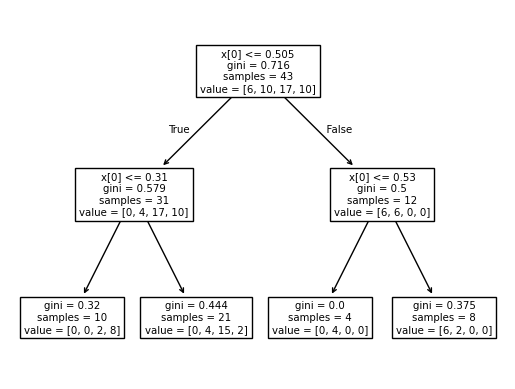

In [52]:
# # Convert categories to numbers
den_redlining_ndvi_gdf['grade_codes'] = (
    den_redlining_ndvi_gdf.grade.cat.codes
)
# Fit model
tree_classifier = DecisionTreeClassifier(max_depth=2).fit(
    #predictor_variables
    den_redlining_ndvi_gdf[['mean']],
    #observed_values
    den_redlining_ndvi_gdf.grade_codes,
)

# Visualize tree
plot_tree(tree_classifier)
plt.show()

In [53]:
den_redlining_ndvi_gdf['predictions']=(
    tree_classifier.predict(den_redlining_ndvi_gdf[['mean']])

)
den_redlining_ndvi_gdf['error']=(
    den_redlining_ndvi_gdf['predictions']
    - den_redlining_ndvi_gdf['grade_codes']
)
#den_redlining_ndvi_gdf['error']
den_redlining_ndvi_gdf.hvplot(c='error', geo=True)

:Polygons   [Longitude,Latitude]   (error)

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It: Plot model results</div></div><div class="callout-body-container callout-body"><p>Create a plot of the results by:</p>
<ol type="1">
<li>Predict grades for each region using the <code>.predict()</code>
method of your <code>DecisionTreeClassifier</code>.</li>
<li>Subtract the actual grades from the predicted grades</li>
<li>Plot the calculated prediction errors as a chloropleth.</li>
</ol></div></div>

One method of evaluating your model’s accuracy is by cross-validation.
This involves selecting some of your data at random, fitting the model,
and then testing the model on a different group. Cross-validation gives
you a range of potential accuracies using a subset of your data. It also
has a couple of advantages, including:

1.  It’s good at identifying overfitting, because it tests on a
    different set of data than it trains on.
2.  You can use cross-validation on any model, unlike statistics like
    $p$-values and $R^2$ that you may have used in the past.

A disadvantage of cross-validation is that with smaller datasets like
this one, it is easy to end up with splits that are too small to be
meaningful, or don’t have all the categories.

Remember – anything above 25% is better than random!

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It: Evaluate the model</div></div><div class="callout-body-container callout-body"><p>Use cross-validation with the <code>cross_val_score</code> to
evaluate your model. Start out with the <code>'balanced_accuracy'</code>
scoring method, and 4 cross-validation groups.</p></div></div>

In [54]:
help(cross_val_score)

Help on function cross_val_score in module sklearn.model_selection._validation:

cross_val_score(estimator, X, y=None, *, groups=None, scoring=None, cv=None, n_jobs=None, verbose=0, fit_params=None, params=None, pre_dispatch='2*n_jobs', error_score=nan)
    Evaluate a score by cross-validation.
    
    Read more in the :ref:`User Guide <cross_validation>`.
    
    Parameters
    ----------
    estimator : estimator object implementing 'fit'
        The object to use to fit the data.
    
    X : {array-like, sparse matrix} of shape (n_samples, n_features)
        The data to fit. Can be for example a list, or an array.
    
    y : array-like of shape (n_samples,) or (n_samples, n_outputs),             default=None
        The target variable to try to predict in the case of
        supervised learning.
    
    groups : array-like of shape (n_samples,), default=None
        Group labels for the samples used while splitting the dataset into
        train/test set. Only used in conjun

In [55]:
# Evaluate the model with cross-validation
cross_val_score(
    DecisionTreeClassifier(max_depth=2),
     #predictor_variables
    den_redlining_ndvi_gdf[['mean']],
    #observed_values
    den_redlining_ndvi_gdf.grade_codes,
    cv=5
)

array([0.55555556, 0.66666667, 1.        , 0.75      , 0.5       ])

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-extra"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Looking for an Extra Challenge?: Fit and evaluate an alternative model</div></div><div class="callout-body-container callout-body"><p>Try out some other models and/or hyperparameters (e.g. changing the
max_depth). What do you notice?</p></div></div>

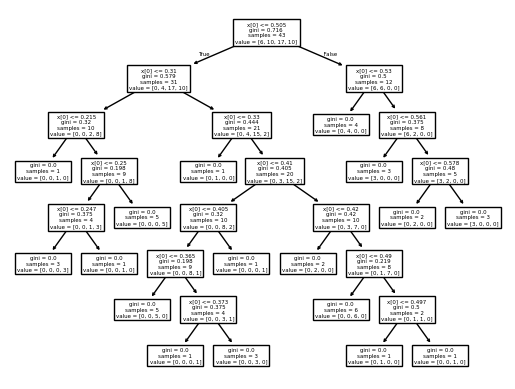

In [56]:
# Try another model

# # Convert categories to numbers
den_redlining_ndvi_gdf['grade_codes'] = (
    den_redlining_ndvi_gdf.grade.cat.codes
)
# Fit model
tree_classifier = DecisionTreeClassifier(random_state=0).fit(
    #predictor_variables
    den_redlining_ndvi_gdf[['mean']],
    #observed_values
    den_redlining_ndvi_gdf.grade_codes,
)

# Visualize tree
plot_tree(tree_classifier)
plt.show()

In [57]:
den_redlining_ndvi_gdf['predictions']=(
    tree_classifier.predict(den_redlining_ndvi_gdf[['mean']])

)
den_redlining_ndvi_gdf['error']=(
    den_redlining_ndvi_gdf['predictions']
    - den_redlining_ndvi_gdf['grade_codes']
)
#den_redlining_ndvi_gdf['error']
den_redlining_ndvi_gdf.hvplot(c='error', geo=True)

:Polygons   [Longitude,Latitude]   (error)

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-respond"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Reflect and Respond</div></div><div class="callout-body-container callout-body"><p>Practice writing about your model. In a few sentences, explain your
methods, including some advantages and disadvantages of the choice.
Then, report back on your results. Does your model indicate that
vegetation health in a neighborhood is related to its redlining
grade?</p></div></div>

# YOUR MODEL DESCRIPTION AND EVALUATION HERE

In [58]:
store den_redlining_ndvi_gdf den_ndvi_zstats

Stored 'den_redlining_ndvi_gdf' (GeoDataFrame)
Stored 'den_ndvi_zstats' (DataFrame)


In [62]:
%%capture
%%bash
jupyter nbconvert redlining_all_notebooks.ipynb --to html